# BMW Paintshop application process

In [191]:
### install some libraries
import pandas as pd
import numpy as np

import seaborn as sns

print('Done')

Done


In [99]:
filepath = 'C:/Users/meo1slp/Desktop/BMW_Assessment/data/P_Data.csv'
p_data_df = pd.read_csv(filepath, index_col=False)
p_data_df = p_data_df.drop('Unnamed: 0', axis = 1)
p_data_df

,timestamp,igef,color,component,presure,voltage,current,spin
0,2023-01-02 08:03:52,1A1000,482,door_left,296,752,238,55488
1,2023-01-02 08:03:52,1A1000,482,door_right,297,751,237,55525
2,2023-01-02 08:03:52,1A1000,482,hood,298,758,229,55530
3,2023-01-02 08:03:52,1A1000,482,top,299,747,239,55467
4,2023-01-02 08:03:52,1A1000,482,trunck,301,748,237,55520
...,...,...,...,...,...,...,...,...
45745,2023-03-27 15:33:42,1A10149,824,door_left,328,6339,380,53975
45746,2023-03-27 15:33:42,1A10149,824,door_right,324,6345,369,54004
45747,2023-03-27 15:33:42,1A10149,824,hood,329,6344,371,53986
45748,2023-03-27 15:33:42,1A10149,824,top,333,6339,369,54033


In [100]:
filepath = 'C:/Users/meo1slp/Desktop/BMW_Assessment/data/P_Material.csv'
p_material_df = pd.read_csv(filepath, index_col=False)
#p_material_df = p_material_df.rename(columns={'id':'color_id'})
p_material_df = p_material_df.drop('id', axis = 1)
p_material_df

,color_name,color_code
0,Thundermorning,178
1,Antartic White,482
2,Sharpy Blue,824
3,Burnt sienna,365
4,Cornflower,276
5,Wild Watermelon,945


In [101]:
filepath = 'C:/Users/meo1slp/Desktop/BMW_Assessment/data/P_Parameters.csv'
p_parameters_df = pd.read_csv(filepath, index_col=False)
#p_parameters_df = p_parameters_df.rename(columns={'id':'color_id'})
p_parameters_df = p_parameters_df.drop('id', axis = 1)
p_parameters_df

,color_code,presure_max,presure_min,voltage_max,voltage_min,current_max,current_min,spin_max,spin_min
0,178,330,320,700,650,370,350,53000,52000
1,482,300,290,750,700,220,200,54000,53000
2,824,340,330,650,600,390,370,55000,54000
3,365,333,245,600,622,350,300,55550,56000
4,276,352,270,725,630,300,210,52500,55250
5,945,360,229,605,645,280,255,53250,53500


In [102]:
filepath = 'C:/Users/meo1slp/Desktop/BMW_Assessment/data/Q_event_Data.csv'
q_event_df = pd.read_csv(filepath, index_col=False)
q_event_df = q_event_df.drop('Unnamed: 0', axis = 1)
q_event_df

,time_q,id_db,component,status
0,2023-01-02 08:22:29,11ed64,door_right,orange
1,2023-01-02 08:22:29,11ed64,hood,orange
2,2023-01-02 08:39:25,c2864e,door_right,orange
3,2023-01-02 08:39:25,c2864e,top,drop
4,2023-01-02 08:39:25,c2864e,door_left,crater
...,...,...,...,...
5694,2023-03-27 15:04:29,ef09f3,door_left,drop
5695,2023-03-27 15:16:16,77a273,hood,drop
5696,2023-03-27 15:25:37,53afe5,top,drop
5697,2023-03-27 15:25:37,53afe5,door_right,crater


In [103]:
filepath = 'C:/Users/meo1slp/Desktop/BMW_Assessment/data/Q_igefs_Data.csv'
q_igefs_df = pd.read_csv(filepath, index_col=False)
q_igefs_df

,igef,id_db
0,1A1005,11ed64
1,1A1010,c2864e
2,1A1012,84f4bd
3,1A1014,3c7451
4,1A1015,61107a
...,...,...
3270,1A10135,ede2a7
3271,1A10138,ef09f3
3272,1A10142,77a273
3273,1A10145,53afe5


In [104]:
filepath = 'C:/Users/meo1slp/Desktop/BMW_Assessment/data/Sensor_Data.csv'
sensor_df = pd.read_csv(filepath, index_col=False)
sensor_df = sensor_df.drop('id', axis = 1)
sensor_df

,Temp,Humy,PM2,PM10,date
0,8.784568,68.436608,4.563273,14.306638,2022-12-01 00:00:00
1,8.597719,71.196812,4.224320,8.803731,2022-12-01 00:15:00
2,7.156690,68.719032,2.308757,13.302654,2022-12-01 00:30:00
3,7.224157,70.742016,2.882976,13.280093,2022-12-01 00:45:00
4,7.802038,70.119131,3.971133,10.650505,2022-12-01 01:00:00
...,...,...,...,...,...
11227,11.326563,69.679487,3.245367,12.247079,2023-03-27 22:45:00
11228,12.399294,71.752105,4.168005,9.187656,2023-03-27 23:00:00
11229,12.153111,69.715894,1.732088,12.887196,2023-03-27 23:15:00
11230,12.148507,71.073981,1.208169,6.298670,2023-03-27 23:30:00


In [ ]:
### Testing

In [129]:
p_data_df = p_data_df.rename(columns={'color':'color_code'})

In [164]:
merged_df = pd.merge(p_data_df, q_igefs_df, on='igef')

In [165]:
merged_df = pd.merge(merged_df, q_event_df, on=['id_db', 'component'], how = 'outer')

In [166]:
merged_df['status'].fillna('OK', inplace = True)

In [167]:
pivoted_df = pd.pivot_table(merged_df, index=['timestamp', 'igef', 'color_code'], columns=['component'], values=['presure', 'voltage', 'current', 'spin', 'status'], aggfunc='first')
pivoted_df.columns = [f'{col[1]}_{col[0]}' for col in pivoted_df.columns]
pivoted_df = pivoted_df.reset_index()

In [168]:
merged_df = pd.merge(pivoted_df, p_material_df, on='color_code')

In [169]:
merged_df

,timestamp,igef,color_code,door_left_current,door_right_current,hood_current,top_current,trunck_current,door_left_presure,door_right_presure,...,door_right_status,hood_status,top_status,trunck_status,door_left_voltage,door_right_voltage,hood_voltage,top_voltage,trunck_voltage,color_name
0,2023-01-02 08:18:12,1A1005,482,237,240,240,249,246,300,300,...,orange,orange,OK,OK,750,756,756,746,756,Antartic White
1,2023-01-02 09:32:14,1A1030,482,246,235,233,243,241,300,297,...,crater,OK,crater,orange,753,754,748,754,752,Antartic White
2,2023-01-02 09:34:57,1A1031,482,238,238,234,244,237,301,300,...,OK,OK,inclusion,drop,747,747,752,755,752,Antartic White
3,2023-01-02 10:03:50,1A1041,482,239,237,239,236,239,303,300,...,drop,drop,OK,OK,750,749,746,751,747,Antartic White
4,2023-01-02 10:28:57,1A1049,482,230,234,236,235,236,297,295,...,OK,OK,OK,crater,750,753,748,755,751,Antartic White
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3270,2023-03-27 13:25:15,1A10106,824,361,370,368,364,368,331,332,...,OK,orange,orange,OK,6340,6337,6337,6346,6344,Sharpy Blue
3271,2023-03-27 14:07:55,1A10120,824,373,362,374,370,368,326,325,...,orange,orange,OK,OK,6346,6346,6348,6344,6342,Sharpy Blue
3272,2023-03-27 14:29:01,1A10127,824,371,370,382,366,363,331,327,...,OK,orange,orange,OK,6344,6346,6344,6345,6340,Sharpy Blue
3273,2023-03-27 14:49:51,1A10135,824,369,368,379,369,373,328,334,...,OK,inclusion,OK,inclusion,6343,6342,6339,6342,6341,Sharpy Blue


In [ ]:
### - End of Testing

In [72]:
pivoted_df = pd.pivot_table(p_data_df, index=['timestamp', 'igef', 'color'], columns=['component'], values=['presure', 'voltage', 'current', 'spin'], aggfunc='first')
pivoted_df.columns = [f'{col[1]}_{col[0]}' for col in pivoted_df.columns]
pivoted_df = pivoted_df.reset_index()


In [73]:
pivoted_df

,timestamp,igef,color,door_left_current,door_right_current,hood_current,top_current,trunck_current,door_left_presure,door_right_presure,...,door_left_spin,door_right_spin,hood_spin,top_spin,trunck_spin,door_left_voltage,door_right_voltage,hood_voltage,top_voltage,trunck_voltage
0,2023-01-02 08:03:52,1A1000,482,238,237,229,239,237,296,297,...,55488,55525,55530,55467,55520,752,751,758,747,748
1,2023-01-02 08:06:32,1A1001,482,235,239,236,254,239,299,304,...,55496,55479,55503,55498,55498,752,755,749,756,751
2,2023-01-02 08:09:08,1A1002,178,369,373,370,369,376,315,326,...,54026,53996,53977,54016,54056,693,693,688,687,691
3,2023-01-02 08:11:47,1A1003,482,238,240,234,242,240,297,302,...,55497,55537,55483,55522,55526,752,753,749,753,755
4,2023-01-02 08:15:14,1A1004,178,369,377,372,372,369,321,319,...,54016,53980,53964,53934,54042,691,686,695,695,692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9145,2023-03-27 15:21:20,1A10145,178,371,373,365,379,371,316,320,...,54005,54032,54000,53942,54022,689,685,694,689,692
9146,2023-03-27 15:24:54,1A10146,824,381,381,373,361,371,330,332,...,53954,54018,53968,53971,53980,6341,6345,6346,6346,6345
9147,2023-03-27 15:28:17,1A10147,482,239,230,234,237,234,299,303,...,55520,55568,55485,55532,55475,754,753,756,752,746
9148,2023-03-27 15:30:55,1A10148,824,374,366,370,369,369,324,331,...,53912,54026,53988,54025,53990,6349,6340,6345,6342,6344


In [74]:
pivoted_df = pivoted_df.rename(columns={'color':'color_code'})

In [75]:
merged_df = pd.merge(pivoted_df, p_material_df, on='color_code')

In [76]:
merged_df = pd.merge(merged_df, p_parameters_df, on='color_code')

In [77]:
merged_df = pd.merge(merged_df, q_igefs_df, on='igef')

In [78]:
merged_df = pd.merge(merged_df, q_event_df, on='id_db')

In [79]:
merged_df

,timestamp,igef,color_code,door_left_current,door_right_current,hood_current,top_current,trunck_current,door_left_presure,door_right_presure,...,voltage_max,voltage_min,current_max,current_min,spin_max,spin_min,id_db,time_q,component,status
0,2023-01-02 08:18:12,1A1005,482,237,240,240,249,246,300,300,...,750,700,220,200,54000,53000,11ed64,2023-01-02 08:22:29,door_right,orange
1,2023-01-02 08:18:12,1A1005,482,237,240,240,249,246,300,300,...,750,700,220,200,54000,53000,11ed64,2023-01-02 08:22:29,hood,orange
2,2023-01-02 09:32:14,1A1030,482,246,235,233,243,241,300,297,...,750,700,220,200,54000,53000,d8e423,2023-01-02 09:36:31,trunck,orange
3,2023-01-02 09:32:14,1A1030,482,246,235,233,243,241,300,297,...,750,700,220,200,54000,53000,d8e423,2023-01-02 09:36:31,top,crater
4,2023-01-02 09:32:14,1A1030,482,246,235,233,243,241,300,297,...,750,700,220,200,54000,53000,d8e423,2023-01-02 09:36:31,door_right,crater
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5694,2023-03-27 14:29:01,1A10127,824,371,370,382,366,363,331,327,...,650,600,390,370,55000,54000,85ddcf,2023-03-27 14:33:18,top,orange
5695,2023-03-27 14:29:01,1A10127,824,371,370,382,366,363,331,327,...,650,600,390,370,55000,54000,85ddcf,2023-03-27 14:33:18,hood,orange
5696,2023-03-27 14:49:51,1A10135,824,369,368,379,369,373,328,334,...,650,600,390,370,55000,54000,ede2a7,2023-03-27 14:54:08,trunck,inclusion
5697,2023-03-27 14:49:51,1A10135,824,369,368,379,369,373,328,334,...,650,600,390,370,55000,54000,ede2a7,2023-03-27 14:54:08,hood,inclusion


In [170]:
sensor_df = sensor_df.rename(columns={'date':'timestamp'})

In [171]:
merged_df['timestamp'] = pd.to_datetime(merged_df['timestamp'])

In [172]:
sensor_df['timestamp'] = pd.to_datetime(sensor_df['timestamp'])

In [173]:
merged_df = merged_df.sort_values(by = 'timestamp', ascending = True)

In [174]:
sensor_df = sensor_df.sort_values(by = 'timestamp', ascending = True)

In [175]:
merged_df = pd.merge_asof(merged_df, sensor_df, on='timestamp', tolerance=pd.Timedelta(minutes=15))

In [178]:
merged_df

,timestamp,igef,color_code,door_left_current,door_right_current,hood_current,top_current,trunck_current,door_left_presure,door_right_presure,...,door_left_voltage,door_right_voltage,hood_voltage,top_voltage,trunck_voltage,color_name,Temp,Humy,PM2,PM10
0,2023-01-02 08:18:12,1A1005,482,237,240,240,249,246,300,300,...,750,756,756,746,756,Antartic White,14.434770,86.510988,2.578587,9.008798
1,2023-01-02 08:35:08,1A1010,178,376,371,380,371,375,315,326,...,689,688,698,689,689,Thundermorning,13.776841,88.444113,1.485553,7.188566
2,2023-01-02 08:40:48,1A1012,824,369,370,373,372,372,335,325,...,6341,6345,6339,6342,6343,Sharpy Blue,13.776841,88.444113,1.485553,7.188566
3,2023-01-02 08:46:47,1A1014,824,373,376,382,368,373,326,329,...,6346,6341,6342,6343,6338,Sharpy Blue,17.121061,87.506716,1.989450,5.731857
4,2023-01-02 08:49:08,1A1015,178,380,374,372,368,363,320,318,...,694,695,694,695,691,Thundermorning,17.121061,87.506716,1.989450,5.731857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3270,2023-03-27 14:49:51,1A10135,824,369,368,379,369,373,328,334,...,6343,6342,6339,6342,6341,Sharpy Blue,20.502338,85.256791,2.251949,7.315674
3271,2023-03-27 15:00:12,1A10138,178,373,373,381,369,374,319,320,...,694,694,693,694,691,Thundermorning,18.653033,85.879607,0.217067,10.078711
3272,2023-03-27 15:11:59,1A10142,178,369,368,369,364,372,320,317,...,689,685,699,690,693,Thundermorning,18.653033,85.879607,0.217067,10.078711
3273,2023-03-27 15:21:20,1A10145,178,371,373,365,379,371,316,320,...,689,685,694,689,692,Thundermorning,20.930076,83.991001,2.234146,9.006059


# Data Analysis

In [197]:
merged_df['color_code'].value_counts()

178    1143
482    1133
824     999
Name: color_code, dtype: int64

In [204]:
# create data frames by color since each color has different process parameter

c178_df = merged_df[merged_df['color_code']== 178]
c482_df = merged_df[merged_df['color_code']== 482]
c824_df = merged_df[merged_df['color_code']== 824]

In [205]:
critical_parameters = c482_df[['door_left_current', 'door_right_current', 'hood_current', 'top_current',  'trunck_current', 'door_left_presure', 'door_right_presure', 'hood_presure', 'top_presure', 'trunck_presure', 'door_left_spin', 'door_right_spin', 'hood_spin', 'top_spin', 'trunck_spin', 'door_left_voltage', 'door_right_voltage', 'hood_voltage', 'top_voltage', 'trunck_voltage', 'Temp', 'Humy', 'PM2', 'PM10']]

In [206]:
critical_parameters

,door_left_current,door_right_current,hood_current,top_current,trunck_current,door_left_presure,door_right_presure,hood_presure,top_presure,trunck_presure,...,trunck_spin,door_left_voltage,door_right_voltage,hood_voltage,top_voltage,trunck_voltage,Temp,Humy,PM2,PM10
0,237,240,240,249,246,300,300,300,298,304,...,55464,750,756,756,746,756,14.434770,86.510988,2.578587,9.008798
10,246,235,233,243,241,300,297,302,298,304,...,55506,753,754,748,754,752,18.058835,88.318205,1.185632,9.947286
11,238,238,234,244,237,301,300,300,305,301,...,55483,747,747,752,755,752,18.058835,88.318205,1.185632,9.947286
17,239,237,239,236,239,303,300,300,300,301,...,55503,750,749,746,751,747,16.562996,88.020799,1.023364,8.161235
21,230,234,236,235,236,297,295,303,304,301,...,55514,750,753,748,755,751,19.800806,89.860196,2.768818,11.210298
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3253,238,241,235,241,240,299,297,303,302,304,...,55541,758,749,754,752,753,22.288483,87.986819,3.029592,8.548351
3254,245,245,240,235,240,298,296,299,299,296,...,55524,752,756,759,751,745,22.288483,87.986819,3.029592,8.548351
3255,237,236,242,231,244,298,300,298,300,301,...,55472,755,755,757,750,754,21.307004,88.028241,2.681918,8.031480
3256,239,248,244,231,240,300,303,302,300,299,...,55545,753,753,757,755,757,21.307004,88.028241,2.681918,8.031480


In [207]:
critical_parameters.corr(method = 'pearson')

,door_left_current,door_right_current,hood_current,top_current,trunck_current,door_left_presure,door_right_presure,hood_presure,top_presure,trunck_presure,...,trunck_spin,door_left_voltage,door_right_voltage,hood_voltage,top_voltage,trunck_voltage,Temp,Humy,PM2,PM10
door_left_current,1.000000,0.018267,0.021259,0.007544,-0.009232,0.013287,-0.037080,0.050075,0.007809,-0.002119,...,0.061204,-0.013802,-0.073785,-0.025402,0.021598,-0.051993,0.032915,-0.029814,-0.011247,-0.012975
door_right_current,0.018267,1.000000,0.046443,-0.005271,-0.012453,0.023567,-0.039311,0.005462,-0.019916,0.053465,...,0.030109,0.011624,0.016729,-0.060104,0.026707,-0.074616,0.006420,0.041933,0.000137,-0.009206
hood_current,0.021259,0.046443,1.000000,-0.026017,0.030445,-0.028041,-0.013312,-0.009679,-0.007941,0.013302,...,-0.035851,-0.021946,0.007757,0.005088,0.002171,-0.027332,0.022963,-0.024515,-0.014465,-0.070354
top_current,0.007544,-0.005271,-0.026017,1.000000,0.007667,0.015924,0.070538,0.033023,-0.003661,0.026995,...,-0.010285,0.014613,0.043024,-0.036843,0.037106,-0.048611,-0.008118,0.006253,-0.001898,0.017014
trunck_current,-0.009232,-0.012453,0.030445,0.007667,1.000000,0.023136,0.018694,0.009745,0.030871,0.040034,...,0.008964,0.058055,0.028378,0.002137,-0.028026,0.017897,-0.005022,-0.009584,0.023923,-0.035072
door_left_presure,0.013287,0.023567,-0.028041,0.015924,0.023136,1.000000,-0.019374,-0.012910,-0.015113,-0.026280,...,0.006049,0.018022,0.041072,-0.005078,-0.007798,-0.075508,0.004531,-0.049087,0.014352,0.014046
door_right_presure,-0.037080,-0.039311,-0.013312,0.070538,0.018694,-0.019374,1.000000,-0.029853,-0.048521,-0.020882,...,-0.013482,0.034553,-0.002438,0.037865,0.018892,-0.008105,-0.054444,0.032343,-0.016597,0.033228
hood_presure,0.050075,0.005462,-0.009679,0.033023,0.009745,-0.012910,-0.029853,1.000000,-0.004844,-0.036370,...,-0.003018,-0.034697,-0.022281,-0.009164,-0.003488,-0.012084,-0.052757,0.028817,-0.020030,-0.002342
top_presure,0.007809,-0.019916,-0.007941,-0.003661,0.030871,-0.015113,-0.048521,-0.004844,1.000000,0.034450,...,0.040640,-0.006849,0.006228,-0.002398,-0.057403,0.013299,0.044443,-0.014020,0.000214,0.012255
trunck_presure,-0.002119,0.053465,0.013302,0.026995,0.040034,-0.026280,-0.020882,-0.036370,0.034450,1.000000,...,0.024277,0.028334,-0.035114,-0.040126,0.042062,-0.013454,0.013751,-0.028452,-0.009463,0.011322


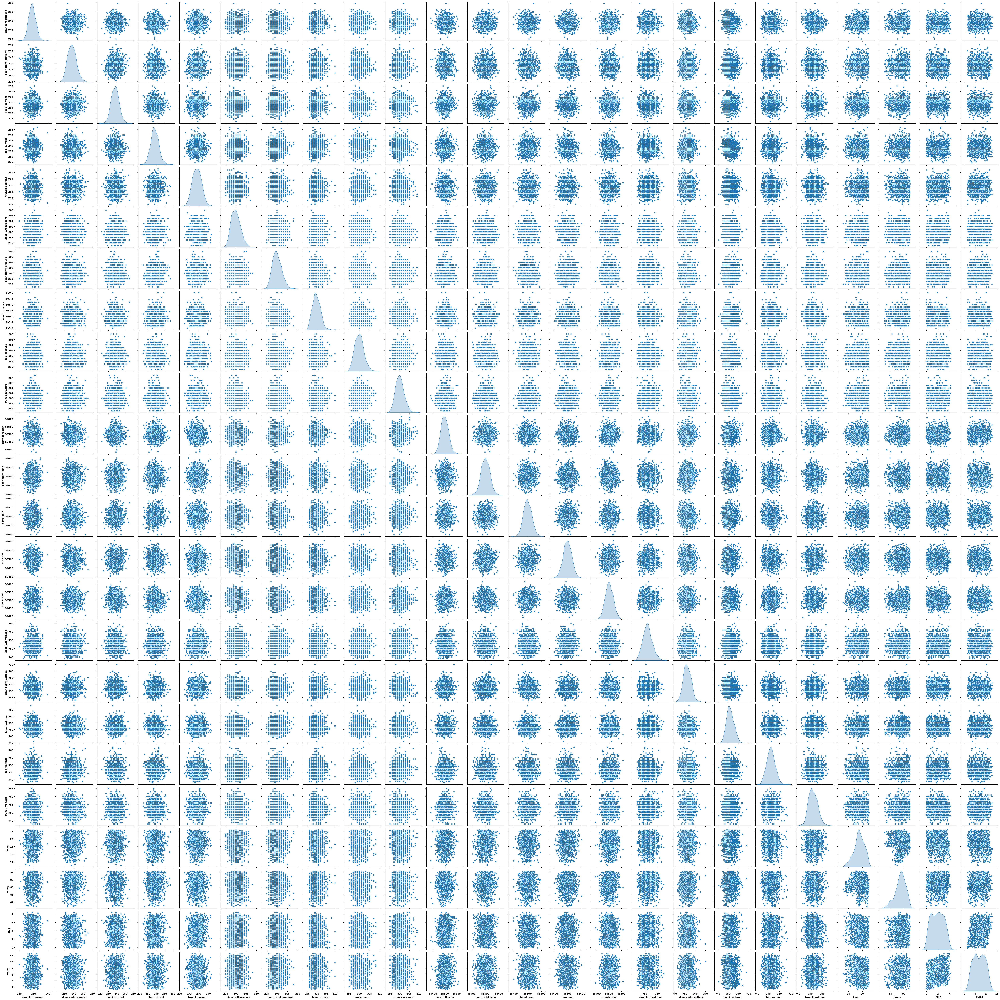

In [208]:
sns.pairplot(critical_parameters, diag_kind='kde')

In [209]:
# maybe a groupby temperature


# XGBoost Model